In [18]:
!nvidia-smi

Thu Aug 31 06:19:18 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   66C    P0    28W /  70W |   1589MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [19]:
!pip install ultralytics

In [20]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')
model.predict(
   source='https://media.roboflow.com/notebooks/examples/dog.jpeg',
   conf=0.25
)


Found https://media.roboflow.com/notebooks/examples/dog.jpeg locally at dog.jpeg
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 27.1ms
Speed: 2.2ms preprocess, 27.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 384)


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted p

In [21]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()


In [22]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="tf2jNwu5lu2KK4wJ7lk2")
project = rf.workspace("pathikreet").project("weapons-detection-qbwdp")
dataset = project.version(1).download("yolov8")



loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.167, to fix: `pip install ultralytics==8.0.134`

Extracting Dataset Version Zip to weapons-detection-1 in yolov8:: 100%|██████████| 2956/2956 [00:01<00:00, 2475.79it/s]


In [23]:
!yolo task=detect \
mode=train \
model=yolov8s.pt \
data={dataset.location}/data.yaml \
epochs=50 \
imgsz=640

Ultralytics YOLOv8.0.167 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/weapons-detection-1/data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=

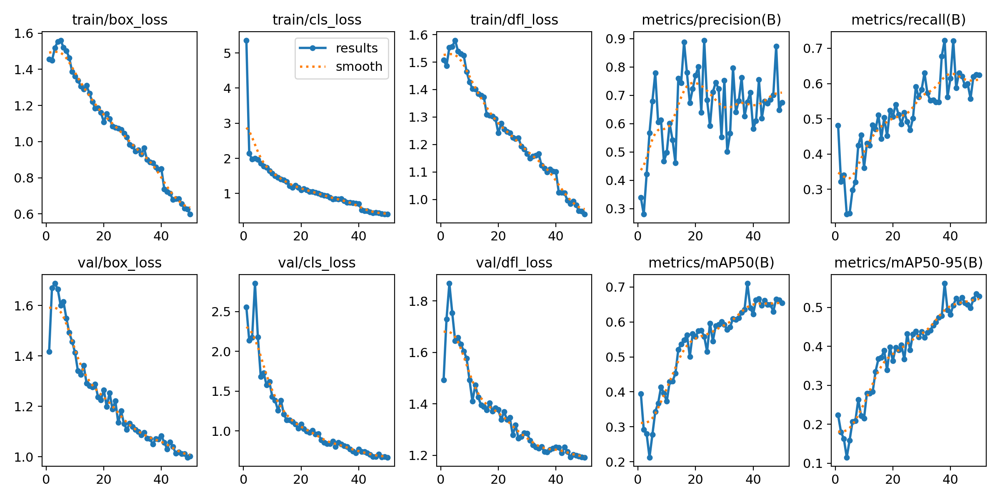

In [24]:
Image(filename=f'/content/runs/detect/train5/results.png', width=600)

In [25]:
!yolo task=detect mode=val model=/content/runs/detect/train5/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.0.167 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127906 parameters, 0 gradients
val: Scanning /content/weapons-detection-1/valid/labels.cache... 295 images, 0 backgrounds, 0 corrupt: 100% 295/295 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 19/19 [00:06<00:00,  3.12it/s]
                   all        295        310      0.675      0.723       0.71      0.559
               billete        295         67        0.7      0.836      0.863       0.61
                 knife        295        203      0.793      0.936      0.954       0.66
              monedero        295          2      0.408        0.5      0.497      0.497
                pistol        295         15      0.761       0.85      0.836       0.65
            smartphone        295         17      0.896      0.882      0.928      0.773
               tarjeta        295          6      0

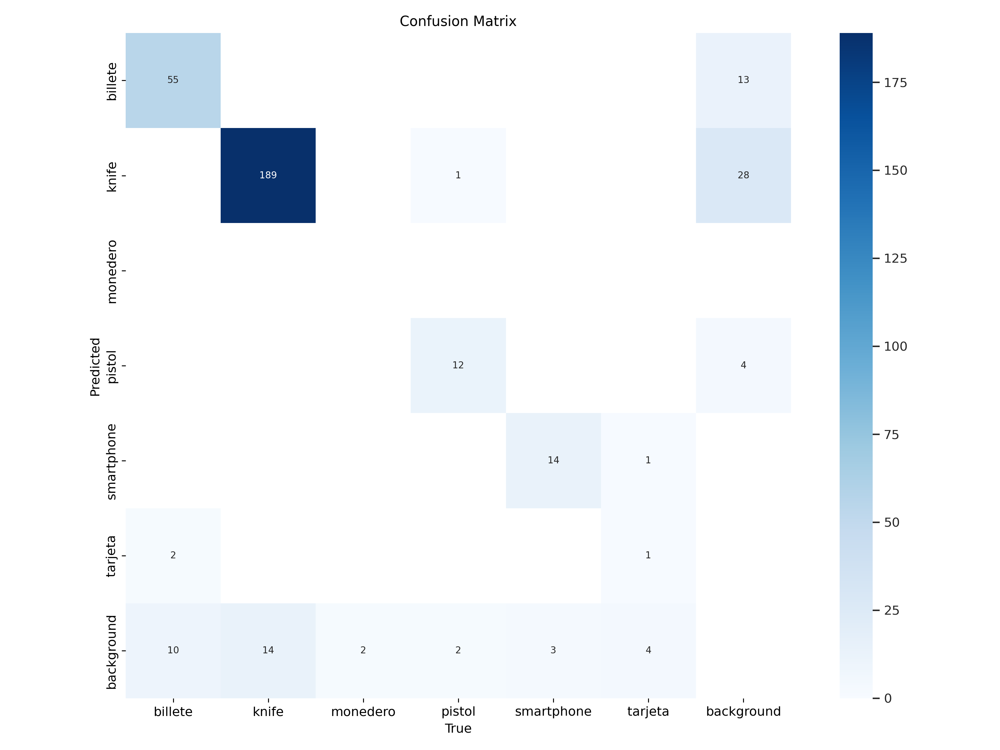

In [26]:
Image(filename=f'/content/runs/detect/val2/confusion_matrix.png', width=600)

In [29]:
!yolo task=detect mode=predict model=/content/runs/detect/train5/weights/best.pt conf=0.5 source={dataset.location}/test/images save_txt=true save_conf=true

Ultralytics YOLOv8.0.167 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127906 parameters, 0 gradients

image 1/147 /content/weapons-detection-1/test/images/ABbframe00154_jpg.rf.4fef0483eb68f66501d7b365f2518202.jpg: 640x640 1 knife, 16.0ms
image 2/147 /content/weapons-detection-1/test/images/ABbframe00271_jpg.rf.7521d30c7da27f78567a27789b1d86f2.jpg: 640x640 1 knife, 16.0ms
image 3/147 /content/weapons-detection-1/test/images/ABbframe00283_jpg.rf.e9b44269b4bafafaca9cac8b826fdd4a.jpg: 640x640 1 knife, 15.9ms
image 4/147 /content/weapons-detection-1/test/images/ABbframe00292_jpg.rf.b1b655ac3fc123053463b88d4a739166.jpg: 640x640 1 knife, 15.9ms
image 5/147 /content/weapons-detection-1/test/images/ABmframe00157_jpg.rf.2e8bbee2f42ff746d7827de03f90818e.jpg: 640x640 1 knife, 15.9ms
image 6/147 /content/weapons-detection-1/test/images/DSC_00071_jpg.rf.ca0cd6dbdf7d6681ea5b652f82473d9a.jpg: 640x640 1 knife, 15.9ms
image 7/147 /content/weapons-de

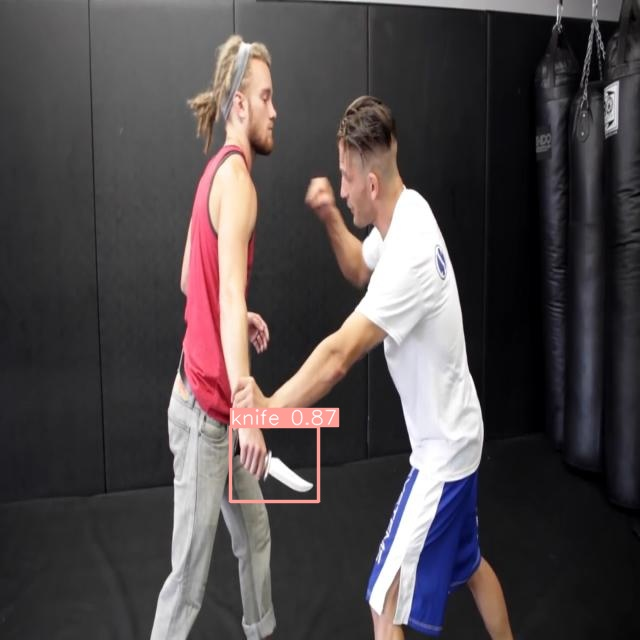

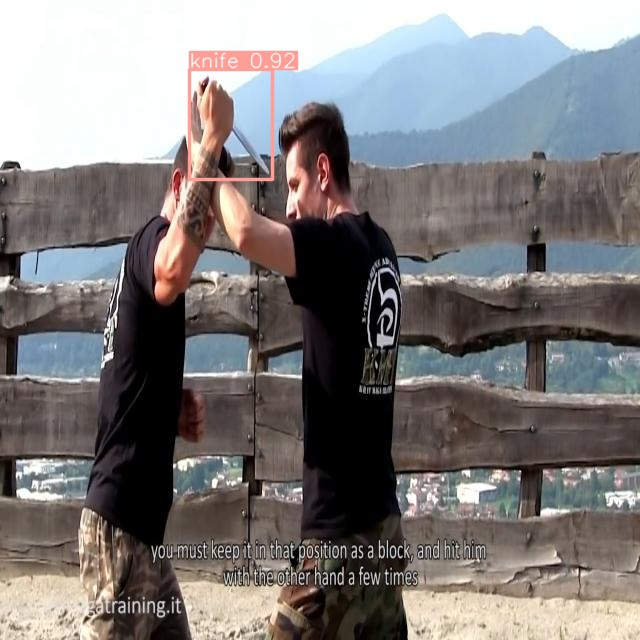

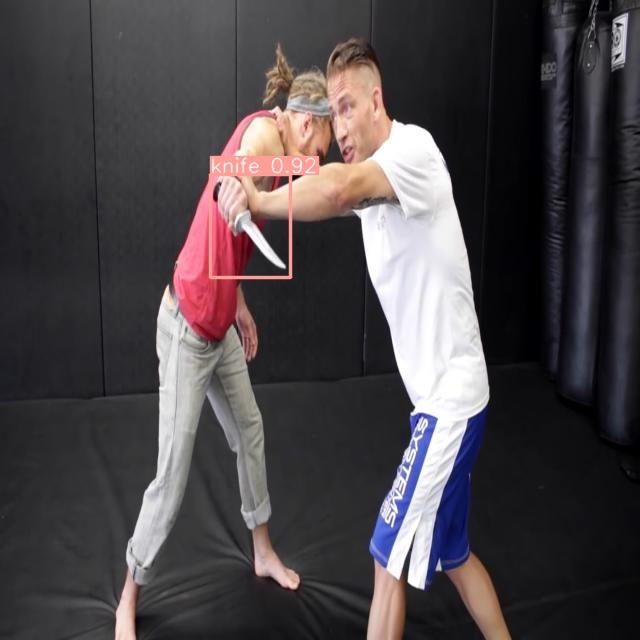

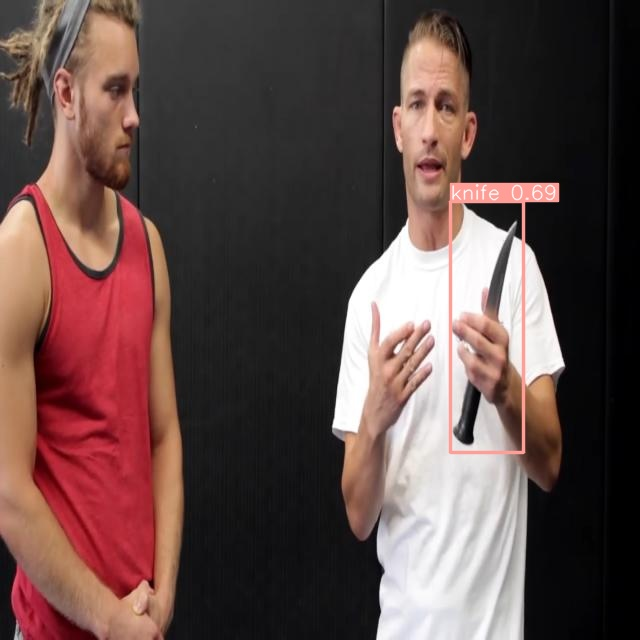

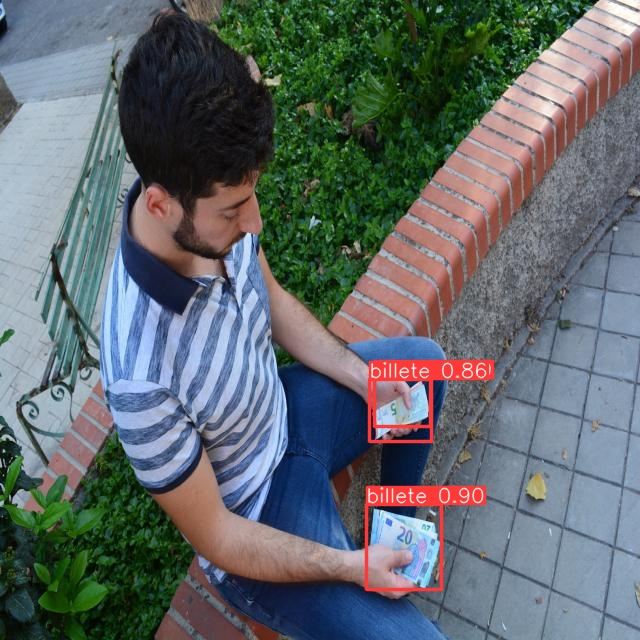

...

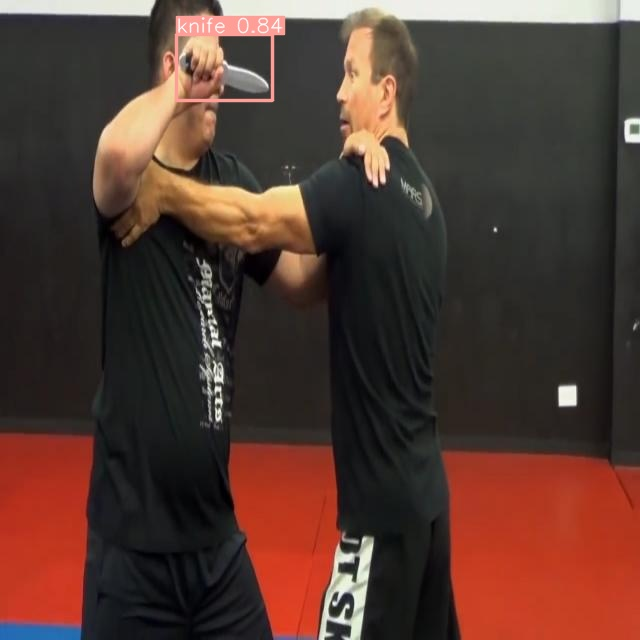

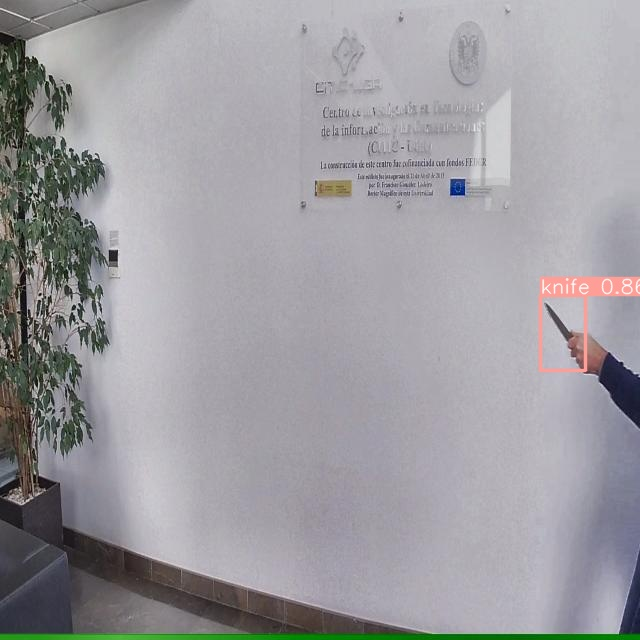

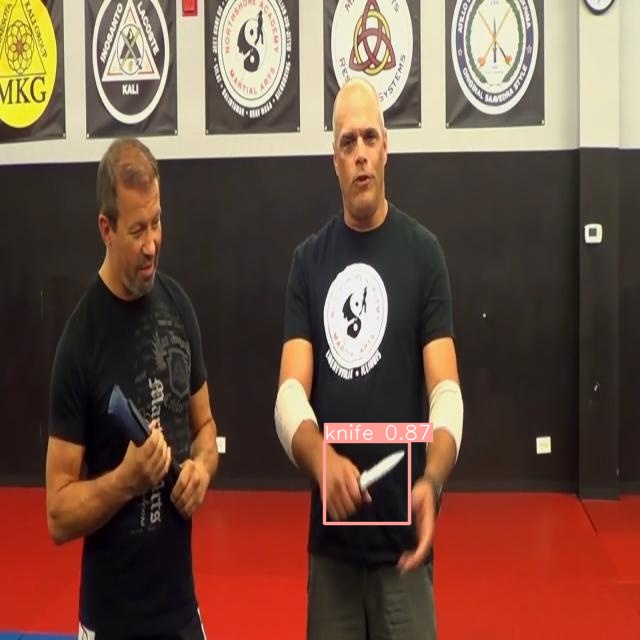

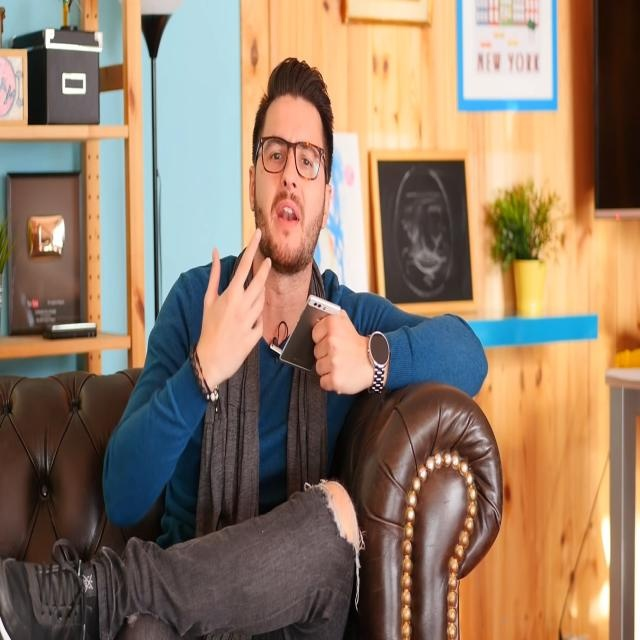

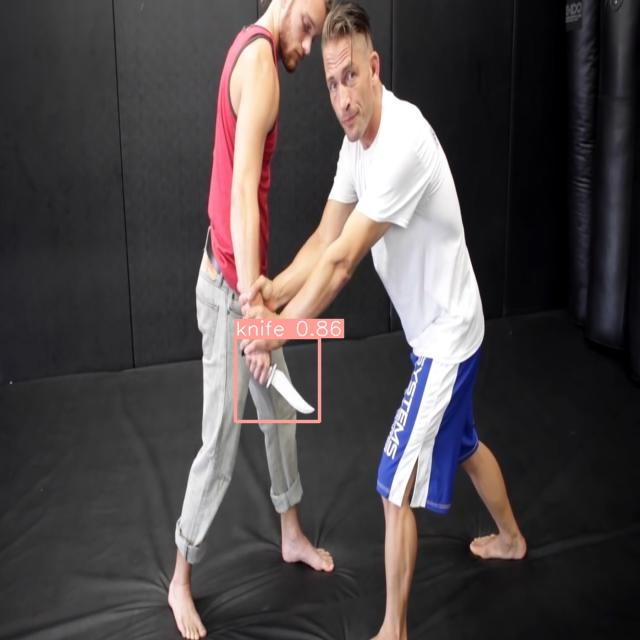

In [30]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict3/*.jpg'):
      display(Image(filename=image_path, height=600))
      print("\n")

In [31]:
pwd

'/content'

In [35]:
version = project.version(2)
version.deploy("yolov8", "/content/runs/detect/train5")

Dependency ultralytics==8.0.134 is required but found version=8.0.167, to fix: `pip install ultralytics==8.0.134`
View the status of your deployment at: https://app.roboflow.com/pathikreet/weapons-detection-qbwdp/2
Share your model with the world at: https://universe.roboflow.com/pathikreet/weapons-detection-qbwdp/model/2
